Автор: Лейман М.А.   
Дата создания: 28.04.2025  

# Задание ZALA  
## 4. Детектирование множества объектов
### ___Модель___:  __fasterrcnn_mobilenet_v3_large_fpn__  
#### ___Backbone___:  __MobileNet__  
#### ___Детекция___:  __Faster R-CNN__ 
#### Многоклассовая детекция  
Модель детектирует объекты 

Датасеты: DOTA, UAVOD, VEDAI  




__Общая схема и компоненты__ 
1. Transform (GeneralizedRCNNTransform)  
Обрабатывает входное изображение: изменение размера, нормализация, аугментации.  
Готовит изображение для подачи в backbone.  
2. Backbone + FPN (BackboneWithFPN)  
Backbone — это основная сверточная сеть (например, ResNet, MobileNet), извлекающая признаки.  
FPN (Feature Pyramid Network) — расширяет результаты backbone, создавая многоуровневые карты признаков для лучше обнаружения объектов разных размеров.  
Это помогает решать задачу multi-scale detection.  
3. Intermediate Layer Getter (IntermediateLayerGetter)  
Это механизм, который извлекает нужные уровни признаков из backbone, чтобы они были использованы дальше.  
4. Region Proposal Network (RPN)  
RPNHead — подсеть, которая работает на картах признаков из backbone+FPN:  
Производит предварительные предложения (локальные окна) — области с высоким шансом содержать объекты.  
Использует AnchorGenerator — генерацию якорных рамок разных размеров и форматов.  
RPN предсказывает:  
Вероятность наличия объекта для каждого якоря  
Корректировки рамок (смещения и размеры)  
5. RoI Heads (RoIHeads)  
После получения предсказаний RPN, они проходят через:  
MultiScaleRoIAlign — вырезает признаки для каждого предложенного региона (ротируемое выравнивание).  
TwoMLPHead — несколько полностью связанных слоев (MLP), чтобы объединить признаки.  
FastRCNNPredictor — финальные предсказания: класс, уточнение рамки.  

Входное изображение  
        |  
    Свёрточные слои (Backbone, MobileNet)  
        |  
   Feature Map (карта признаков)  
        |  
   RPN — предсказание регионов (RoIs)  
        |  
  Фильтрация и выбираются лучшие RoIs  
        |  
  RoI Pooling / RoI Align — извлечение признаков для каждого региона  
        |  
  Классификатор и регрессор — определение класса и точных границ объектов  
        |  
  Итоговые боксы, классы, вероятности  

## Импорты

In [ ]:
import time
from glob import glob
import os 
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import warnings
import torch
from matplotlib import rcParams
warnings.filterwarnings("ignore")
rcParams['figure.figsize'] = (14,6)

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from IPython.display import clear_output
import random
from torch.utils.data import random_split
from PIL import ImageOps
from tqdm import tqdm
from utils.visualize_img import plot_image_with_boxes

print('Виртуальное окружение')
!which python 
# Текущее положение
print('\nТекущее положение: ')
path_1 = os.getcwd()
print(path_1)

Виртуальное окружение
/home/maksim/develops/python/env1/bin/python

Текущее положение: 
/home/maksim/develops/python/Zala_task/Zala_task


## Проверка GPU

In [2]:
# Устанавливаем device:  gpu или cpu


if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print("работаем на устройстве: ", device)
print('Версия torch:           ', torch.__version__)
print("версия  cuDNN:          ", torch.backends.cudnn.version())

# ПРОВЕРКА GPU
!nvidia-smi

работаем на устройстве:  cuda
Версия torch:            2.7.1+cu126
версия  cuDNN:           91100
Tue Aug 12 20:08:15 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 575.57.08              Driver Version: 575.57.08      CUDA Version: 12.9     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3060        On  |   00000000:01:00.0  On |                  N/A |
|  0%   54C    P5             24W /  170W |    2624MiB /  12288MiB |     25%      Default |
|                                         

In [3]:
# Получаем текущую директорию
path_dir = os.getcwd()
print("Текущая директория:", path_dir)

DATA_DIR = os.path.abspath(os.path.join(path_dir, 'dataset'))
print("Путь к dataset:", DATA_DIR)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


Текущая директория: /home/maksim/develops/python/Zala_task/Zala_task
Путь к dataset: /home/maksim/develops/python/Zala_task/Zala_task/dataset


 ## ДОП. ФУНКЦИИ

In [ ]:
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchvision import transforms
from torchvision.ops import nms
from PIL import Image
import torchvision.transforms.functional as F1
import torchvision.ops as ops









def custom_collate_fn(batch):
    images, targets = zip(*batch)  # Разделяем изображения и аннотации
    images = torch.stack(images, dim=0)  # Объединяем изображения в один тензор
    
    # Аннотации собираем в список, потому что количество боксов может быть разным для разных изображений
    targets = [{'boxes': target['boxes'], 'labels': target['labels']} for target in targets]
    
    return images, targets




## ДАТАСЕТ

In [5]:
import random, numpy as np, torch
from PIL import Image, ImageEnhance
import torchvision.transforms.functional as TF

class CustomAugmentations:
    """
    p_flip       – вероятность горизонтального/вертикального флипа
    p_brightness – вероятность изменения яркости
    p_noise      – вероятность добавления шума
    """
    def __init__(self, img_size=736, p_flip=0.3, p_brightness=0.2, p_noise=0.2):
        self.img_size     = img_size
        self.p_flip       = p_flip
        self.p_brightness = p_brightness
        self.p_noise      = p_noise

 
    @staticmethod
    def _add_noise(img_np, std=10):
        noise = np.random.normal(0, std, img_np.shape).astype(np.float32)
        img_np = np.clip(img_np.astype(np.float32) + noise, 0, 255).astype(np.uint8)
        return img_np

    @staticmethod
    def _resize_boxes(boxes, old_wh, new_wh):
        ow, oh = old_wh; nw, nh = new_wh
        scale_x, scale_y = nw / ow, nh / oh
        boxes = boxes.clone()
        boxes[:, [0, 2]] *= scale_x
        boxes[:, [1, 3]] *= scale_y
        return boxes

    def __call__(self, img: Image.Image, boxes: torch.Tensor):
        w, h = img.size

        # горизонтальный флип
        if random.random() < self.p_flip:
            img = TF.hflip(img)
            boxes[:, [0, 2]] = w - boxes[:, [2, 0]]

        # вертикальный флип
        if random.random() < self.p_flip:
            img = TF.vflip(img)
            boxes[:, [1, 3]] = h - boxes[:, [3, 1]]

        # изменение яркости
        if random.random() < self.p_brightness:
            factor = random.uniform(0.8, 1.2)
            img = ImageEnhance.Brightness(img).enhance(factor)

        # гауссов шум
        if random.random() < self.p_noise:
            img = Image.fromarray(self._add_noise(np.array(img)))

        #  ресайз
        img = img.resize((self.img_size, self.img_size), Image.BILINEAR)
        # boxes = self._resize_boxes(boxes, (w, h), (self.img_size, self.img_size))

        # тензор
        img = TF.to_tensor(img)        
        return img, boxes

val_transform = transforms.Compose([
    transforms.Resize((736, 736)),
    transforms.ToTensor(),
])

In [6]:
from torch.utils.data import Dataset
from torchvision.transforms import Compose
import os
from PIL import Image
import torch

class YoloToDetectionDataset(Dataset):
    def __init__(self, images_dir, targets_dir, image_size=736, transforms=None):
        self.images_dir = images_dir
        self.targets_dir = targets_dir
        self.image_size = image_size
        self.transforms = transforms

        self.image_filenames = sorted(os.listdir(images_dir))
        self.target_filenames = sorted(os.listdir(targets_dir))

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        img_path = os.path.join(self.images_dir, self.image_filenames[idx])
        img = Image.open(img_path).convert("RGB")
        orig_w, orig_h = img.size

        label_path = os.path.join(self.targets_dir, self.target_filenames[idx])
        boxes = []
        labels = []

        with open(label_path, "r") as f:
            for line in f.readlines():
                if not line.strip(): continue
                parts = line.strip().split()
                if len(parts) != 5: continue

                class_id = int(parts[0]) + 1  # +1, добавляем  фон — 0
                x_center, y_center, width, height = map(float, parts[1:])

                # Фильтрация нулевой ширины или высоты
                if width == 0 or height == 0:
                    continue


                x_center *= orig_w
                y_center *= orig_h
                width *= orig_w
                height *= orig_h

                xmin = x_center - width / 2
                ymin = y_center - height / 2
                xmax = x_center + width / 2
                ymax = y_center + height / 2

                boxes.append([xmin, ymin, xmax, ymax])
                labels.append(class_id)

        if not boxes:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
        else:
            boxes = torch.tensor(boxes, dtype=torch.float32)
            labels = torch.tensor(labels, dtype=torch.int64)

        # АУГМЕНТАЦИИ 
        if self.transforms:
            if isinstance(self.transforms, Compose):
                img = self.transforms(img)
            else:
                img, boxes = self.transforms(img, boxes)

        # Ресайз боксов
        new_w, new_h = self.image_size, self.image_size
        scale_x = new_w / orig_w
        scale_y = new_h / orig_h
        boxes[:, [0, 2]] *= scale_x
        boxes[:, [1, 3]] *= scale_y

        target = {"boxes": boxes, "labels": labels}
        return img, target


## МОДЕЛЬ

In [7]:
import torch
from torchvision import models

# Загрузка предобученной модели MobileNetV2 для детекции объектов
model = models.detection.fasterrcnn_mobilenet_v3_large_fpn(pretrained=True)

model.eval();


## LOSS 

In [8]:
import torch
import torch.nn.functional as F2


## Метрика

## загрузка датасета

In [12]:
from torchvision import transforms

img_size = 736
# Трансформации
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
])

train_transforms = CustomAugmentations(
    img_size=736,
    p_flip=0.5,
    p_brightness=0.2,
    p_noise=0.1
)


# Получаем текущую рабочую папку  
current_directory = os.getcwd()  

path_dataset = os.path.join(current_directory, "data/dataset/dataset_full_1")

# Датасет  train
images_dir="images/train/"
targets_dir="labels/train/"
path_image = os.path.join(path_dataset, images_dir)
path_label = os.path.join(path_dataset, targets_dir)

dataset_train_1 = YoloToDetectionDataset(
    images_dir=path_image,
    targets_dir=path_label,
    transforms=train_transforms,
    image_size=img_size
)


# Датасет  test
images_dir="images/test/"
targets_dir="labels/test/"
path_image = os.path.join(path_dataset, images_dir)
path_label = os.path.join(path_dataset, targets_dir)

dataset_test = YoloToDetectionDataset(
    images_dir=path_image,
    targets_dir=path_label,
    transforms=transform,
    image_size=img_size
)


# Датасет  val
images_dir="images/val/"
targets_dir="labels/val/"
path_image = os.path.join(path_dataset, images_dir)
path_label = os.path.join(path_dataset, targets_dir)

dataset_val = YoloToDetectionDataset(
    images_dir=path_image,
    targets_dir=path_label,
    transforms=transform,
    image_size=img_size
)


train_transforms_2 = CustomAugmentations(
    img_size=736,
    p_flip=0.2,
    p_brightness=0.3,
    p_noise=0.2
)

path_dataset = os.path.join(current_directory, "data/dataset/dataset_full_2")

# Датасет  train
images_dir="images/train/"
targets_dir="labels/train/"
path_image = os.path.join(path_dataset, images_dir)
path_label = os.path.join(path_dataset, targets_dir)

dataset_train_2 = YoloToDetectionDataset(
    images_dir=path_image,
    targets_dir=path_label,
    transforms=train_transforms_2,
    image_size=img_size
)


train_transforms_3 = CustomAugmentations(
    img_size=736,
    p_flip=0.4,
    p_brightness=0.3,
    p_noise=0.2
)

path_dataset = os.path.join(current_directory, "data/dataset/dataset_full_3")

# Датасет  train
images_dir="images/train/"
targets_dir="labels/train/"
path_image = os.path.join(path_dataset, images_dir)
path_label = os.path.join(path_dataset, targets_dir)

dataset_train_3 = YoloToDetectionDataset(
    images_dir=path_image,
    targets_dir=path_label,
    transforms=train_transforms_3,
    image_size=img_size
)


train_transforms_4 = CustomAugmentations(
    img_size=736,
    p_flip=0.4,
    p_brightness=0.3,
    p_noise=0.3
)

path_dataset = os.path.join(current_directory, "data/dataset/dataset_full_4")
images_dir="images/train/"
targets_dir="labels/train/"
path_image = os.path.join(path_dataset, images_dir)
path_label = os.path.join(path_dataset, targets_dir)

dataset_train_4 = YoloToDetectionDataset(
    images_dir=path_image,
    targets_dir=path_label,
    transforms=train_transforms_4,
    image_size=img_size
)


# Проверка
img, target = dataset_train_1[0]
print(img.shape)          
print(target)             # {'boxes': ..., 'labels': ...}

torch.Size([3, 736, 736])
{'boxes': tensor([[303.2320, 648.4160, 397.4400, 736.0000],
        [305.4400, 536.5440, 390.0800, 557.8880],
        [406.2720, 712.4480, 443.8080, 732.3200],
        [160.4480, 678.5920, 207.5520, 722.0160]]), 'labels': tensor([1, 1, 7, 1])}


### Просмотр датасета

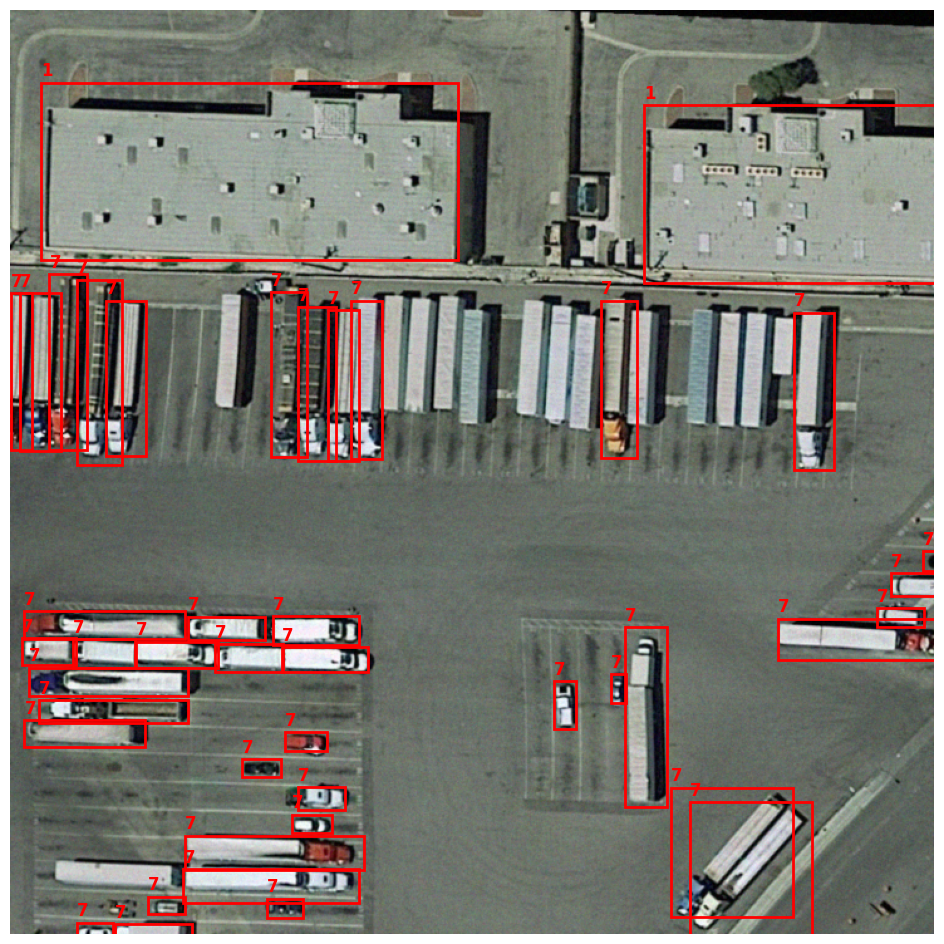

In [ ]:
import random
from utils.visualize_img import visualize_sample

idx = random.randint(0, len(dataset_train_3) - 1) 
img, target = dataset_train_3[idx]


# список названий классов
class_names = None


visualize_sample(img, target, class_names=class_names)


### Даталоадер

torch.Size([4, 3, 736, 736])


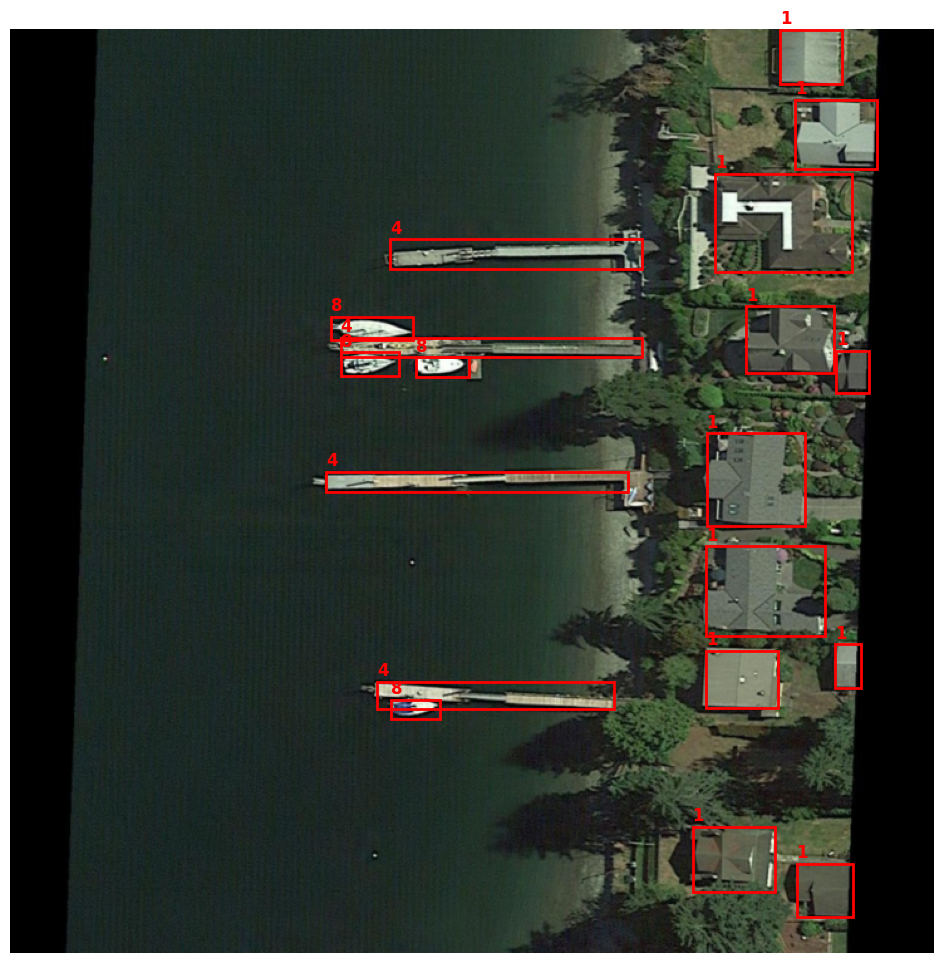

In [14]:
from torch.utils.data import DataLoader
from torchvision import transforms
from torch.utils.data.dataloader import default_collate
# DataLoader
loader = DataLoader(dataset_train_3, batch_size=4, shuffle=True, collate_fn=custom_collate_fn)

# Проверка Размер батча изображений
for images, targets in loader:
    print(images.shape)  
    break


# Пример извлечения одного изображения из DataLoader
for images, targets in loader:
    # Извлекаем одно изображение и его аннотации
    img = images[0]  # Первое изображение в батче
    target = targets[0]  # Аннотации 

    # изображение с боксами
    visualize_sample(img, target)
    break 

loader = None

## Функция тренировки

In [ ]:
""" 
loss = (
    loss_dict['loss_classifier']         # распознавание объектов
  + loss_dict['loss_box_reg']            # точность боксов
  + loss_dict['loss_objectness']         # обнаружение объектов вообще
  + loss_dict['loss_rpn_box_reg']        # локализация candidate proposals
)
"""

def train_epoch(model, loader, optimizer, device, flag=0):
    model.train()
    total_loss = 0
    total_iou = 0
    iou_count = 0

    loop = tqdm(loader, desc="Тренировка", leave=False)
    for imgs, targets in loop:
        imgs = imgs.to(device)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(imgs, targets)  # словарь лоссов

        if  flag==0:
            losses = (
                0.2*loss_dict['loss_classifier']         
                + 0.2*loss_dict['loss_box_reg']           
                + 3.0*loss_dict['loss_objectness']         
                + 0.3*loss_dict['loss_rpn_box_reg']      
                )

        elif flag == 1:
            losses = (
                0.2*loss_dict['loss_classifier']         
                + 0.2*loss_dict['loss_box_reg']           
                + 3.0*loss_dict['loss_objectness']         
                + 0.4*loss_dict['loss_rpn_box_reg']      
                )  
        else:
            losses = (
                0.2*loss_dict['loss_classifier']         
                + 0.2*loss_dict['loss_box_reg']           
                + 2.0*loss_dict['loss_objectness']         
                + 0.4*loss_dict['loss_rpn_box_reg']      
                )
        total_loss += losses.item()

        loop.set_postfix(loss=losses.item())
        if flag != 0:
            optimizer.zero_grad()
            losses.backward()
            optimizer.step()      

    avg_loss = total_loss / len(loader)

    if flag == 0:
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
    return avg_loss




import torch
import random
import matplotlib.pyplot as plt
from IPython.display import clear_output
from tqdm import tqdm


from torchvision.ops import box_iou
import torchvision
import numpy as np


@torch.no_grad()
def val_epoch(model, loader, device, class_names, threshold=0.5, draw=True):
    model.eval()
    loop = tqdm(loader, desc="Валидация", leave=False)

    all_ious = []
    all_precisions = []
    all_recalls = []

    last_image = None
    last_preds = None
    last_targets = None

    for imgs, targets in loop:
        imgs = imgs.to(device)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        preds = model(imgs)

        for i in range(len(imgs)):
            pred = preds[i]
            target = targets[i]

            pred_boxes = pred['boxes']
            pred_labels = pred['labels']
            pred_scores = pred['scores']

            # Пропускаем, если предсказания слишком плохие
            keep = pred_scores >= threshold
            pred_boxes = pred_boxes[keep]
            pred_labels = pred_labels[keep]

            target_boxes = target['boxes']
            target_labels = target['labels']

            if len(pred_boxes) == 0 or len(target_boxes) == 0:
                iou = 0.0
                precision = 0.0
                recall = 0.0
            else:
                ious = box_iou(pred_boxes, target_boxes)  # [N_pred, N_gt]
                max_ious, _ = ious.max(dim=1)
                matched = max_ious >= 0.5
                tp = matched.sum().item()
                fp = len(pred_boxes) - tp
                fn = len(target_boxes) - tp

                precision = tp / (tp + fp + 1e-6)
                recall = tp / (tp + fn + 1e-6)
                iou = max_ious.mean().item()

            all_ious.append(iou)
            all_precisions.append(precision)
            all_recalls.append(recall)

            # Сохраняем последнее изображение последнего батча
            last_image = imgs[-1].cpu()
            last_preds = preds[-1] if isinstance(preds, list) else preds
            last_targets = targets[-1]


        loop.set_postfix(iou=np.mean(all_ious), precision=np.mean(all_precisions), recall=np.mean(all_recalls))
    clear_output(wait=True)
    # Визуализация примера из последнего батча
    if draw and last_image is not None:
        plot_image_with_boxes(
            last_image,
            pred_boxes=last_preds['boxes'].cpu(),
            pred_labels=last_preds['labels'].cpu(),
            pred_scores=last_preds['scores'].cpu(),
            target_boxes=last_targets['boxes'].cpu(),
            target_labels=last_targets['labels'].cpu(),
            class_names=class_names,
            score_threshold=threshold
        )

    mean_iou = np.mean(all_ious)
    mean_precision = np.mean(all_precisions)
    mean_recall = np.mean(all_recalls)

    return mean_iou, mean_precision, mean_recall


def train_fasterrcnn(model, train_loader_1, train_loader_2, train_loader_3, train_loader_4, val_loader, device, lr=0.001, epochs=10, save_path="data/models_custom/checkpoints", name_model="best_model.pth"):
    
    os.makedirs(save_path, exist_ok=True)
    train_losses = []
    val_losses = []
    val_ious = []
    train_ious = []
    best_iou = 0.0
    best_val_iou = 0.0
    best_val_precision = 0.0
    best_val_recall = 0.0
    patience = 10
    wait = 0
    best_val_loss = float("inf")
    CLASSES = ['__background__', 'building', 'plane', 'fish net', 'harbor', 'well', 'helicopter', 'vehicle', 'ship']


    lr_init = lr
    optimizer = optim.AdamW(model.parameters(), lr=lr_init)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.3)
    
    for epoch in range(epochs):
        print("Использование устройства :", device)
        print(f"\n[Эпоха {epoch+1}/{epochs}]")

        # Обучение модели
        if (epoch + 1) < 2:
            train_loss = train_epoch(
                model, train_loader_1, optimizer, device, flag=0
            )

        elif (epoch + 1) < 4:
            train_loss = train_epoch(
                model, train_loader_2, optimizer, device, flag=1
            )
           
        elif (epoch + 1) % 2 == 0:
            train_loss = train_epoch(
                model, train_loader_3, optimizer, device, flag=2
            )
         
        else:
            train_loss = train_epoch(
                model, train_loader_4, optimizer, device, flag=2
            )
        
        # Валидация  
        val_iou, val_precision, val_recall = val_epoch(
            model, val_loader, device, class_names=None,
            threshold=0.5,
            draw=True,
        )
                
        scheduler.step()

        print(f"Эпоха {epoch+1}: Train Loss={train_loss:.4f} | Val IoU={val_iou:.4f} | Prec={val_precision:.4f} | Recall={val_recall:.4f}")
        train_losses.append(train_loss)
        val_ious.append(val_iou)
        # Сохраняем модель, если IoU улучшился
        # if val_iou >= best_val_iou:
        #     best_val_iou = val_iou
        if val_recall >= best_val_recall:
            best_val_recall = val_recall
            best_val_precision = val_precision
            best_val_iou = val_iou
            wait = 0
            torch.save(model.state_dict(), os.path.join(save_path, name_model))
            print(f" Сохранена лучшая модель (IoU={val_iou:.4f} | Prec={val_precision:.4f} | Recall={val_recall:.4f})")
        else:
            wait += 1
            print(f"Улучшений нет. Patience: {wait}/{patience}  Лучшие метрики: IoU={best_val_iou:.4f} | Prec={best_val_precision:.4f} | Recall={best_val_recall:.4f}")
            if wait >= patience:
                print("Обучение остановлено из-за отсутствия улучшений.")
                break

        
    plt.figure(figsize=(12, 4))

    #  Train Val Loss 
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.title("Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    # Train  Val IoU 
    plt.subplot(1, 2, 2)
    plt.plot(val_ious, label='Val IoU', color='green')
    plt.title("IoU")
    plt.xlabel("Epoch")
    plt.ylabel("IoU")
    plt.legend()

    plt.tight_layout()
    plt.show()



## Обучение

In [ ]:
from torchvision import models

model = models.detection.fasterrcnn_mobilenet_v3_large_fpn(pretrained=False)


epochs=25
# S=16
# B=2
# C=1
lr=0.0001
batch_size=12
save_path="data/models_custom/checkpoints"
name_model = "fasterrcnn_model_1.pth"


# train_size = int(0.8 * len(dataset))
# val_size = len(dataset) - train_size
# train_dataset, val_dataset = random_split(dataset, [train_size, val_size])


train_loader_1 = DataLoader(dataset_train_1, batch_size=batch_size, shuffle=True, collate_fn=custom_collate_fn)
train_loader_2 = DataLoader(dataset_train_2, batch_size=batch_size, shuffle=True, collate_fn=custom_collate_fn)

train_loader_3 = DataLoader(dataset_train_3, batch_size=batch_size, shuffle=True, collate_fn=custom_collate_fn)
train_loader_4 = DataLoader(dataset_train_4, batch_size=batch_size, shuffle=True, collate_fn=custom_collate_fn)

val_loader = DataLoader(dataset_val, batch_size=batch_size, shuffle=True, collate_fn=custom_collate_fn)
test_loader = DataLoader(dataset_test, batch_size=batch_size, shuffle=True, collate_fn=custom_collate_fn)

model_path = os.path.join(save_path, name_model)

In [ ]:
import torch
from torchvision.utils import draw_bounding_boxes
import torchvision.transforms.functional as F
from matplotlib import pyplot as plt

def has_invalid_boxes(boxes):
    widths = boxes[:, 2] - boxes[:, 0]
    heights = boxes[:, 3] - boxes[:, 1]
    return (widths <= 0) | (heights <= 0)

def show_image_with_boxes(image_tensor, boxes):
    img = F.to_pil_image(image_tensor)
    img_with_boxes = draw_bounding_boxes(
        image_tensor.mul(255).byte(), boxes, width=2, colors="red"
    )
    plt.figure(figsize=(8, 8))
    plt.imshow(F.to_pil_image(img_with_boxes))
    plt.axis("off")
    plt.show()

def check_dataset_for_invalid_boxes(dataset):
    for idx in range(len(dataset)):
        image, target = dataset[idx]
        boxes = target['boxes']
        invalid_mask = has_invalid_boxes(boxes)

        if invalid_mask.any():
            print(f" Плохие  box(es) в {idx}")
            print("плохой  boxes:")
            print(boxes[invalid_mask])

            show_image_with_boxes(image, boxes[invalid_mask])

            if hasattr(dataset, 'img_paths'):
                print("Image path:", dataset.img_paths[idx])

In [15]:
# check_dataset_for_invalid_boxes(dataset_train_1)

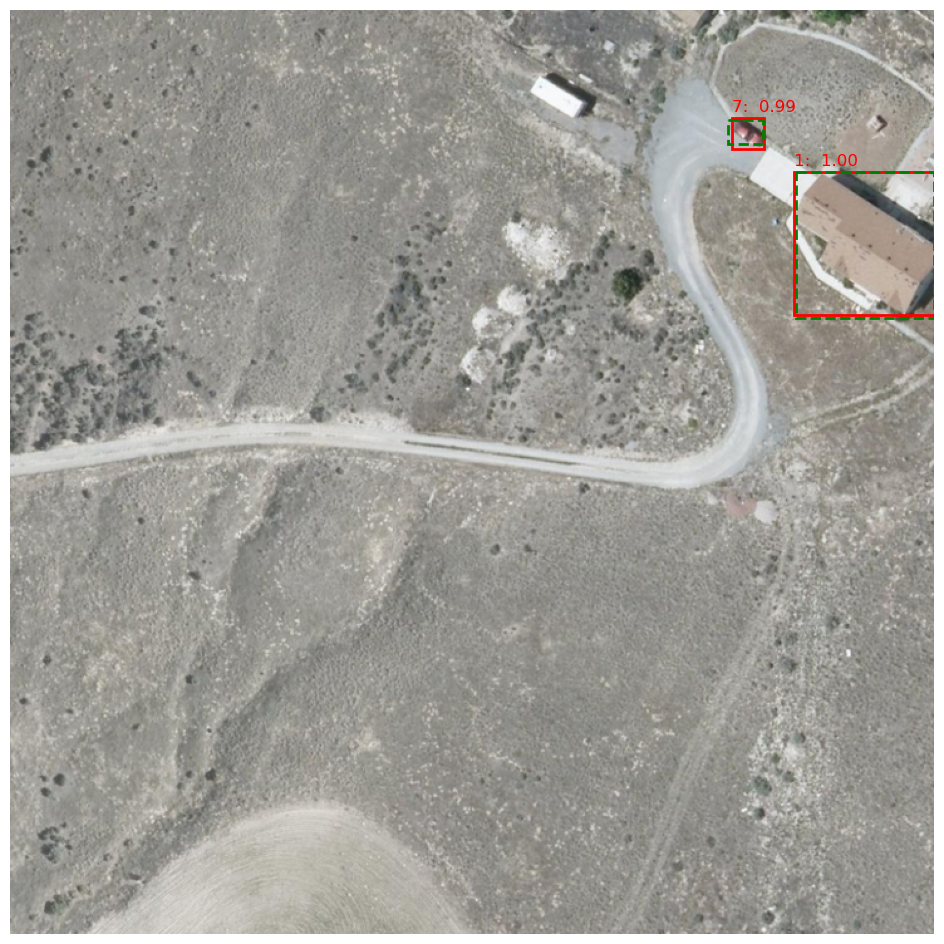

Эпоха 21: Train Loss=0.1975 | Val IoU=0.7403 | Prec=0.9163 | Recall=0.8628
Улучшений нет. Patience: 10/10  Лучшие метрики: IoU=0.7399 | Prec=0.9155 | Recall=0.8643
Обучение остановлено из-за отсутствия улучшений.


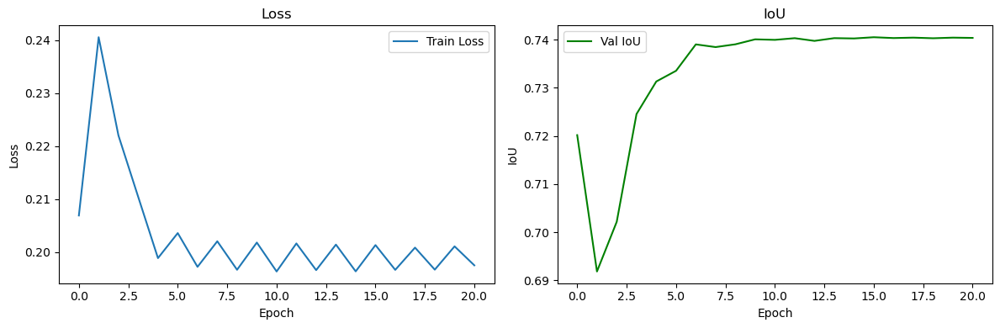

In [16]:
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)

tar = train_fasterrcnn(model, train_loader_1, train_loader_2, train_loader_3, train_loader_4, val_loader, device, lr=lr, epochs=epochs, save_path=save_path, name_model=name_model)

## Использование модели 


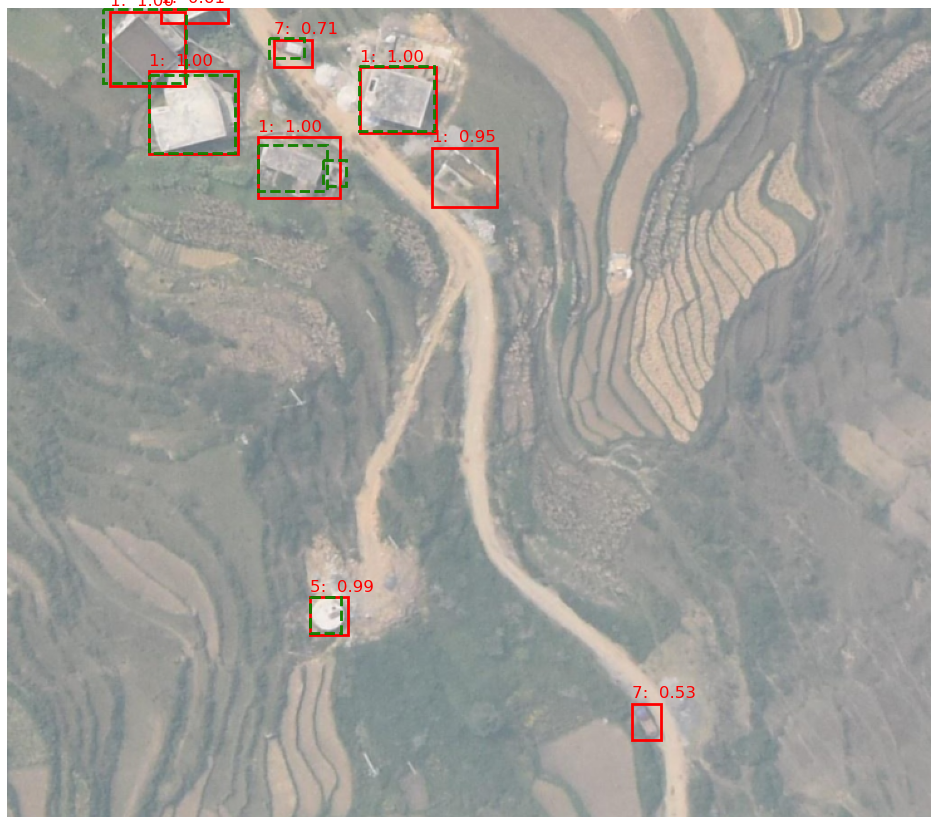



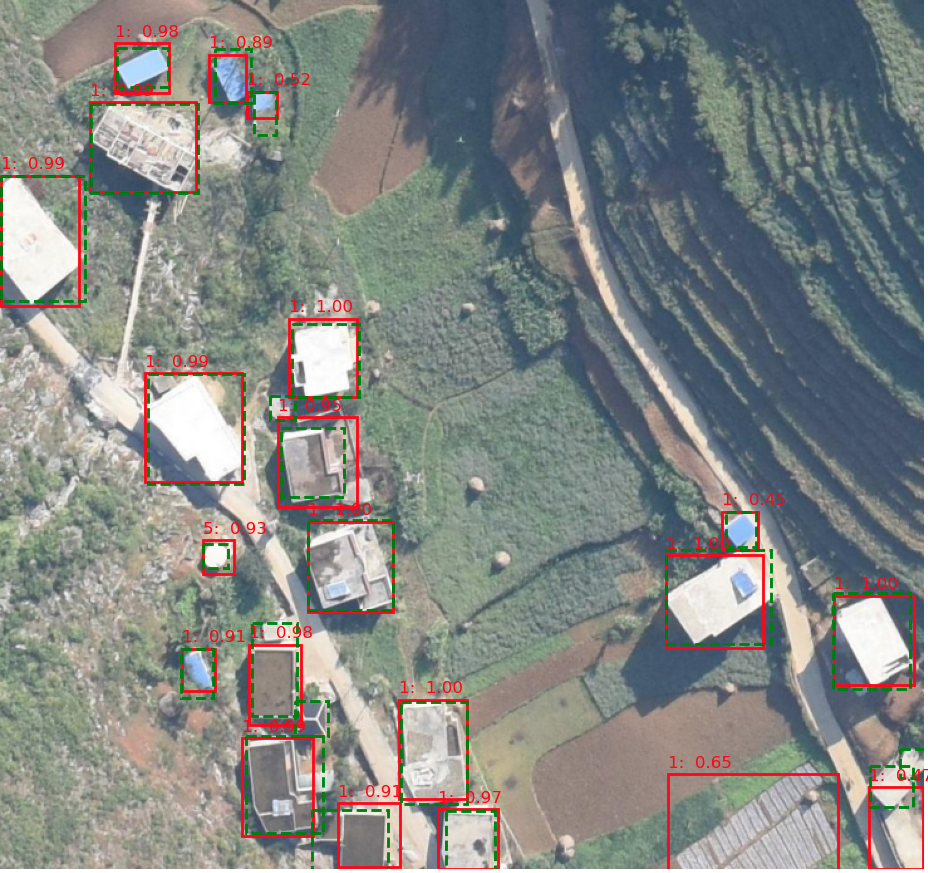 

In [16]:
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device);

In [17]:
import numpy as np
import torch
from torchvision.ops import box_iou
from tqdm import tqdm

@torch.no_grad()
def model_prediction(model,
               loader,
               device,
               class_names=None,
               threshold=0.5,
               draw_idx=None,          # индекс изображения, которое будем отображать
               iou_threshold=0.5):     # IoU-порог для TP / FP / FN
    """
    Возвращает mean_iou, mean_precision, mean_recall
    и  отображает выбранное изображение draw_idx.
    """
    model.eval()

    all_ious, all_precisions, all_recalls = [], [], []

    # запомним нужные данные для отображения
    plot_data = None         # (img, pred, target)

    for batch_i, (imgs, targets) in enumerate(tqdm(loader, desc="Тест")):
        imgs = imgs.to(device)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        preds = model(imgs)

        for i in range(len(imgs)):
            pred_boxes   = preds[i]['boxes']
            pred_scores  = preds[i]['scores']
            pred_labels  = preds[i]['labels']

            keep = pred_scores >= threshold
            pred_boxes  = pred_boxes [keep]
            pred_labels = pred_labels[keep]

            tgt_boxes   = targets[i]['boxes']
            tgt_labels  = targets[i]['labels']

            #  метрики 
            if len(pred_boxes) == 0 or len(tgt_boxes) == 0:
                iou = precision = recall = 0.0
            else:
                ious_matrix      = box_iou(pred_boxes, tgt_boxes)
                max_ious, _      = ious_matrix.max(dim=1)
                matched          = max_ious >= iou_threshold
                tp               = matched.sum().item()
                fp               = len(pred_boxes) - tp
                fn               = len(tgt_boxes) - tp

                precision = tp / (tp + fp + 1e-6)
                recall    = tp / (tp + fn + 1e-6)
                iou       = max_ious.mean().item()

            all_ious.append(iou)
            all_precisions.append(precision)
            all_recalls.append(recall)

            #  сохраняем изображение  для визуализации 
            global_idx = batch_i * loader.batch_size + i
            if draw_idx is not None and global_idx == draw_idx:
                plot_data = (imgs[i].cpu(),
                             preds[i], targets[i])

    mean_iou      = np.mean(all_ious)
    mean_precision = np.mean(all_precisions)
    mean_recall    = np.mean(all_recalls)

    print(f"\nTest IoU={mean_iou:.4f} | Precision={mean_precision:.4f} | Recall={mean_recall:.4f}")
    # отрисовка 
    if plot_data is not None:
        img_cpu, pred, tgt = plot_data
        plot_image_with_boxes(
            img_cpu,
            pred_boxes = pred['boxes'].cpu(),
            pred_labels= pred['labels'].cpu(),
            pred_scores= pred['scores'].cpu(),
            target_boxes = tgt['boxes'].cpu(),
            target_labels= tgt['labels'].cpu(),
            class_names  = class_names,
            score_threshold = threshold,
            iou_threshold   = iou_threshold
        )

    return mean_iou, mean_precision, mean_recall


Тест: 100%|██████████| 557/557 [04:11<00:00,  2.22it/s]



Test IoU=0.7501 | Precision=0.8954 | Recall=0.7967


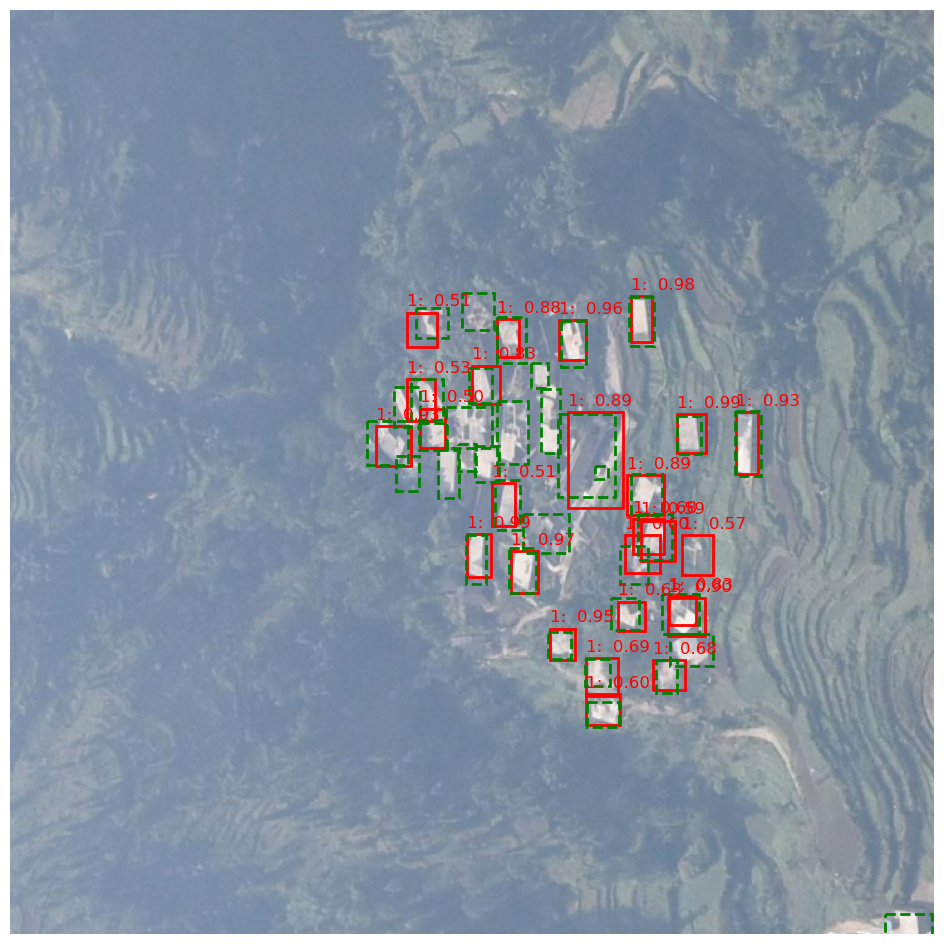

In [19]:
iou, prec, rec = model_prediction(
    model,
    train_loader_1,
    device,
    class_names=None,     
    threshold=0.5,
    draw_idx=0             
)


Тест: 100%|██████████| 229/229 [01:14<00:00,  3.06it/s]



Test IoU=0.7399 | Precision=0.9155 | Recall=0.8643


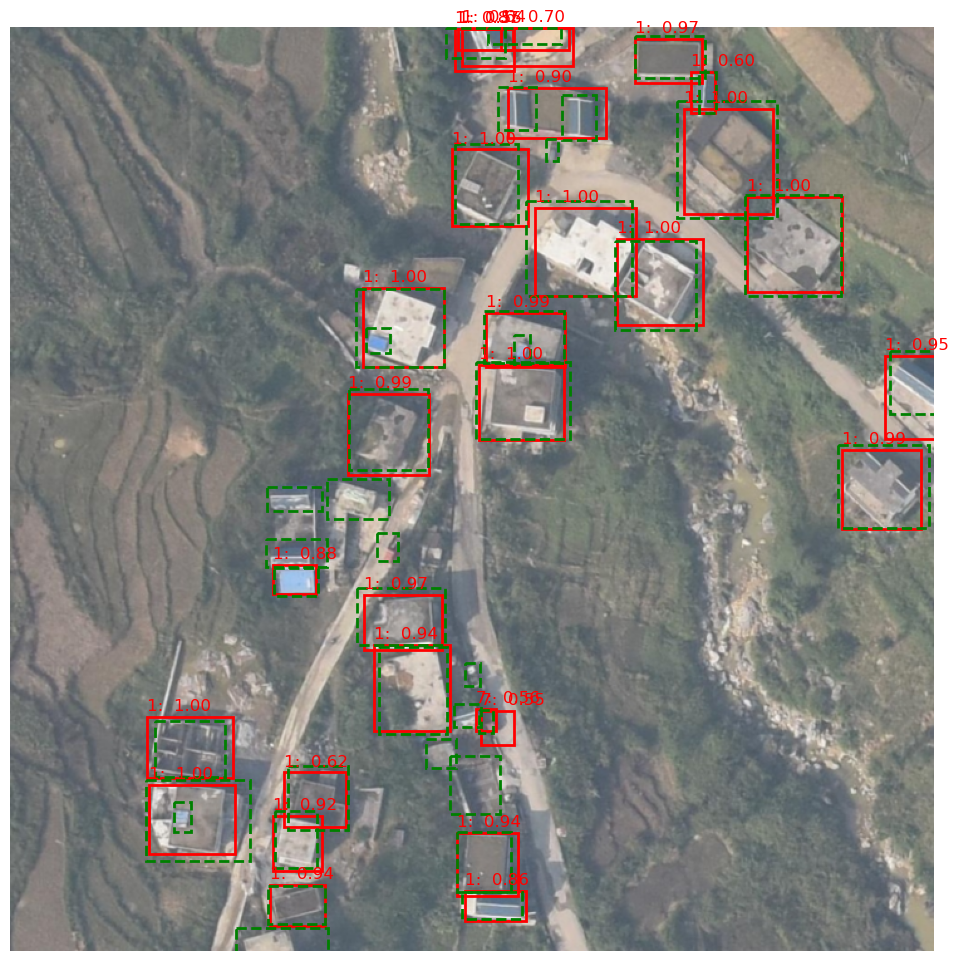

In [20]:
iou, prec, rec = model_prediction(
    model,
    val_loader,
    device,
    class_names=None,     
    threshold=0.5,
    draw_idx=0               
)

Тест: 100%|██████████| 215/215 [01:12<00:00,  2.97it/s]



Test IoU=0.7337 | Precision=0.9061 | Recall=0.8556


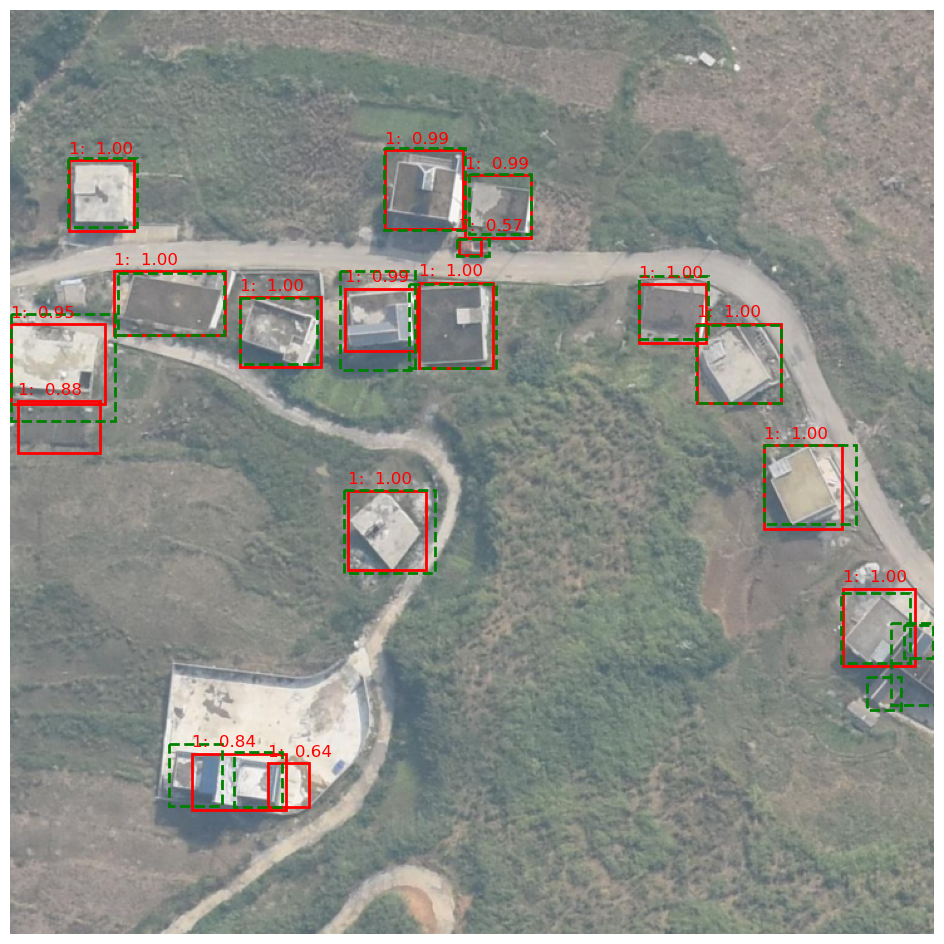

In [21]:
iou, prec, rec = model_prediction(
    model,
    test_loader,
    device,
    class_names=None,    
    threshold=0.5,
    draw_idx=0               
)

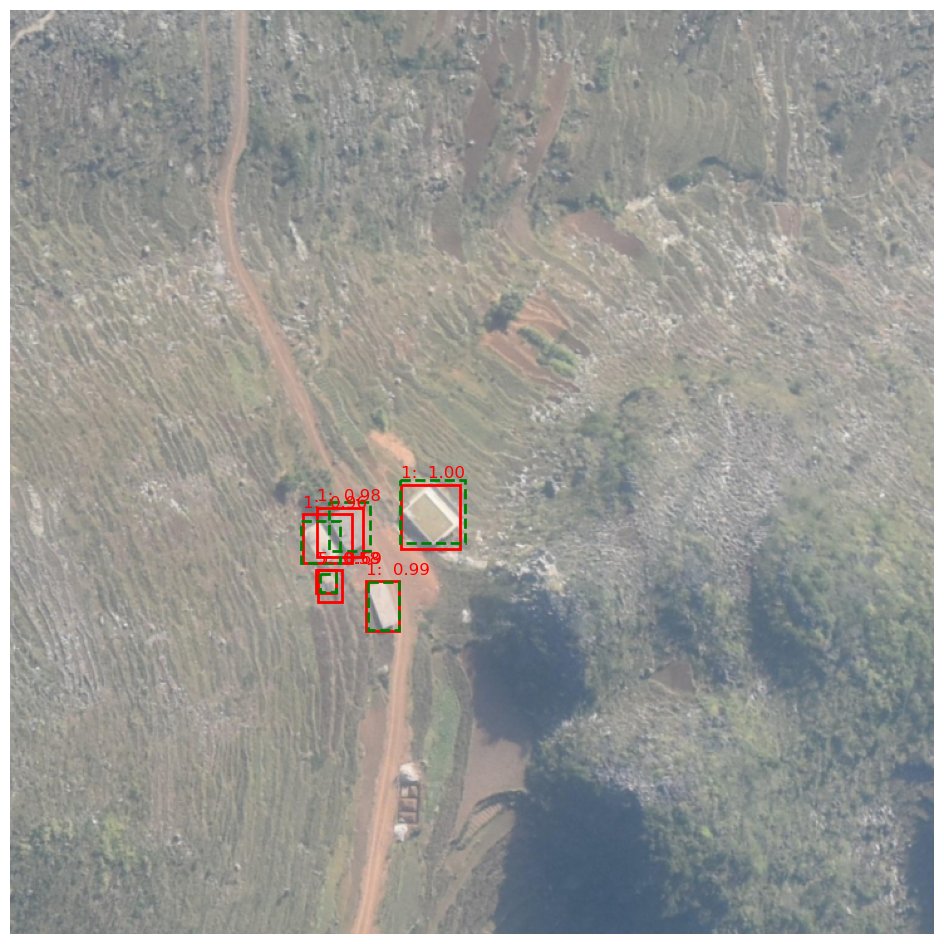

In [18]:
model.eval()

with torch.no_grad():
    for images, targets in test_loader:
        images = [img.to(device) for img in images]

        predictions = model(images)

        idx = 0  # первая картинку из батча

        # Предсказания
        pred_boxes = predictions[idx]['boxes'].cpu()
        pred_labels = predictions[idx]['labels'].cpu()
        pred_scores = predictions[idx]['scores'].cpu()

        #  таргеты
        target_boxes = targets[idx]['boxes'].cpu()
        target_labels = targets[idx]['labels'].cpu()

        plot_image_with_boxes(
            images[idx].cpu(),
            pred_boxes=pred_boxes,
            pred_labels=pred_labels,
            pred_scores=pred_scores,
            target_boxes=target_boxes,
            target_labels=None,
            class_names=None,
            score_threshold=0.4,
            iou_threshold=0.5
        )

        break  


## Сравнение

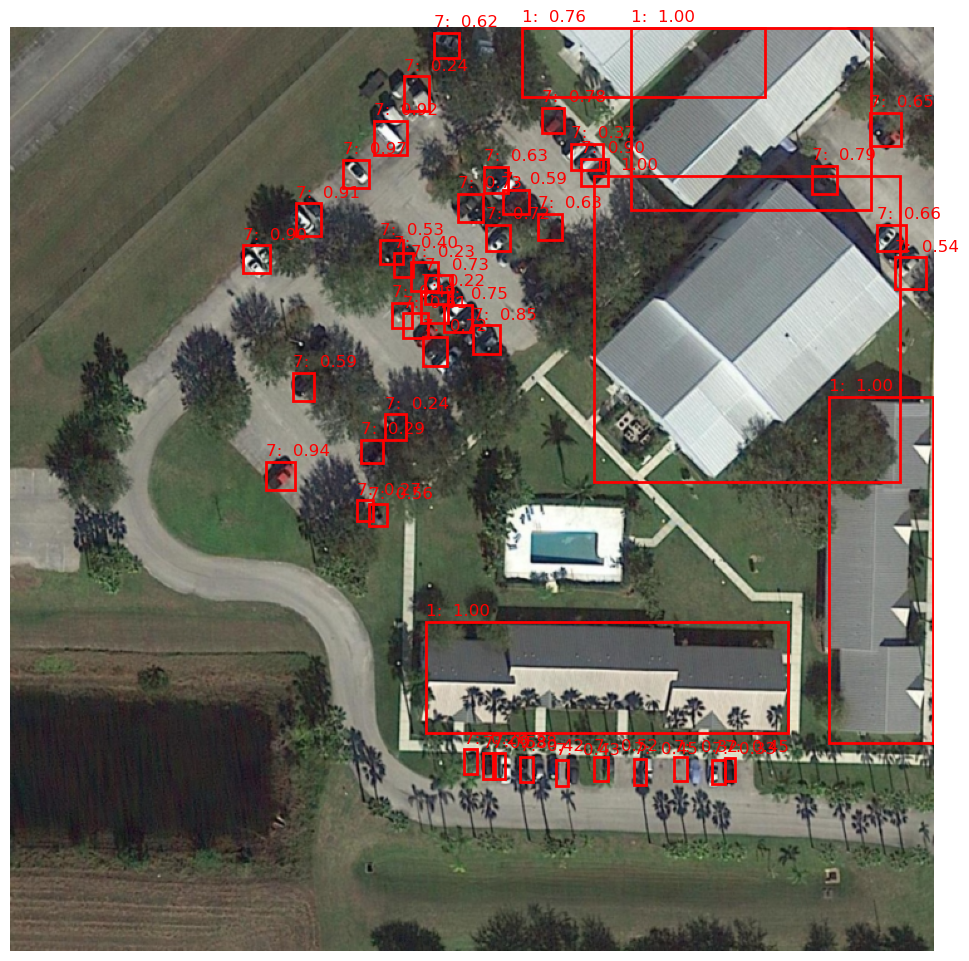

In [ ]:
from utils.visualize_img import inference_model_faster

save_path="data/models_custom/checkpoints"
name_model = "fasterrcnn_model_1.pth"

model_path = os.path.join(save_path, name_model)

model = models.detection.fasterrcnn_mobilenet_v3_large_fpn(pretrained=False)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()

# Путь к изображению
current_directory = os.getcwd()  
patch_image = os.path.join(current_directory, "data/dataset/TEST/images/P0179_0_crop8.jpg")

inference_model_faster(model, patch_image, device, S=16, B=2, C=1, threshold=0.2, iou_thresh=0.2, size=736)


## ПАРАМЕТРЫ МОДЕЛИ

In [16]:
from ptflops import get_model_complexity_info

model = models.detection.fasterrcnn_mobilenet_v3_large_fpn(pretrained=True)

with torch.cuda.device(0):  
    macs, params = get_model_complexity_info(model, (3, 736, 736), as_strings=True,
                                             print_per_layer_stat=False, verbose=False)
    print(f'FLOPs: {macs}')
    print(f'Parameters: {params}')


FLOPs: 4.57 GMac
Parameters: 19.33 M


In [20]:
import torch
from thop import profile



# Создаем входные тензоры разного размера
dummy_736 = torch.randn(1, 3, 736, 736)
dummy_1024 = torch.randn(1, 3, 1024, 1024)

# Вычисляем FLOPs и параметры для 
flops_736, params_736= profile(model, inputs=(dummy_736,), verbose=False)

# Вычисляем FLOPs и параметры для 1024x1024
flops_1024, params_1024 = profile(model, inputs=(dummy_1024,), verbose=False)

# Возвращаем данные в GFLOPs и миллионах параметров
{
    "736x736": {
        "GFLOPs": flops_736 / 1e9,
        "Params (M)": params_736 / 1e6
    },
    "1024x1024": {
        "GFLOPs": flops_1024 / 1e9,
        "Params (M)": params_1024 / 1e6
    }
}


{'736x736': {'GFLOPs': 4.501216312, 'Params (M)': 19.386354},
 '1024x1024': {'GFLOPs': 4.501216312, 'Params (M)': 19.386354}}

In [ ]:
import torch.nn as nn
model = models.detection.fasterrcnn_mobilenet_v3_large_fpn(pretrained=True)

layer_count = sum(1 for layer in model.modules() if isinstance(layer, (nn.Conv2d, nn.BatchNorm2d, nn.ReLU, nn.LeakyReLU, nn.Dropout,nn.Linear)))
print(f"Количество слоёв: {layer_count}")

layer_count = sum(1 for _ in model.modules())
print(f"Всего слоёв: {layer_count}")


Количество слоёв: 93
Всего слоёв: 280


In [ ]:
from torchinfo import summary

model = models.detection.fasterrcnn_mobilenet_v3_large_fpn(pretrained=True)
summary(model, input_size=(1, 3, 736, 736))


Layer (type:depth-idx)                                  Output Shape              Param #
FasterRCNN                                              [0, 4]                    --
├─GeneralizedRCNNTransform: 1-1                         [1, 3, 800, 800]          --
├─BackboneWithFPN: 1-2                                  [1, 256, 13, 13]          --
│    └─IntermediateLayerGetter: 2-1                     [1, 960, 25, 25]          --
│    │    └─Conv2dNormActivation: 3-1                   [1, 16, 400, 400]         (432)
│    │    └─InvertedResidual: 3-2                       [1, 16, 400, 400]         (400)
│    │    └─InvertedResidual: 3-3                       [1, 24, 200, 200]         (3,136)
│    │    └─InvertedResidual: 3-4                       [1, 24, 200, 200]         (4,104)
│    │    └─InvertedResidual: 3-5                       [1, 40, 100, 100]         (9,960)
│    │    └─InvertedResidual: 3-6                       [1, 40, 100, 100]         (20,432)
│    │    └─InvertedResidual: 3-7